# Install dataset

Initial code skeleton follows https://github.com/shashankag14/fine-tune-object-detector

In [1]:
!pip install roboflow
!pip install pycocotools


from roboflow import Roboflow
rf = Roboflow(api_key="VFCYbCkJ3PN2saaTRmN2")
project = rf.workspace("roboflow-gw7yv").project("self-driving-car")
dataset = project.version(3).download("coco")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.0/69.0 kB 1.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 6.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 20.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 6.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 27.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 6.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.5/77.5 kB 7.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 4.8 MB/s eta 0:00:00
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.1.1
    Uninstalling pyparsing-3.1.1:
      Successfully uninstalled pyparsing-3.1.1
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.8.1.78
    Uninstalling opencv-python-headless-4.8.1.78:
      Successfully uninstall

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Self-Driving-Car-3 in coco:: 100%|██████████| 29804/29804 [00:07<00:00, 4036.69it/s]


In [2]:
import numpy as np
import cv2
import os
from datetime import datetime

from PIL import Image

import torch
import torchvision

from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torch.utils.data import Dataset, DataLoader, Subset
import torchvision.transforms.functional as F

from sklearn.model_selection import train_test_split
from tqdm import tqdm

from matplotlib import pyplot as plt
import pickle

import pandas as pd
import glob as glob
import random

In [3]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
print("We use the following device: ", device)

from google.colab import drive
drive.mount('/content/drive')

We use the following device:  cuda
Mounted at /content/drive


#View The Data / Set up custom dataset

In [4]:
import matplotlib.patches as patches

def plot_image(img, boxes, scores, labels, dataset, save_path=None):
  '''
  Function that draws the BBoxes, scores, and labels on the image.

  inputs:
    img: input-image as numpy.array (shape: [H, W, C])
    boxes: list of bounding boxes (Format [N, 4] => N times [xmin, ymin, xmax, ymax])
    scores: list of conf-scores (Format [N] => N times confidence-score between 0 and 1)
    labels: list of class-prediction (Format [N] => N times an number between 0 and _num_classes-1)
    dataset: list of all classes e.g. ["background", "class1", "class2", ..., "classN"] => Format [N_classes]
  '''

  # Convert PIL Image to NumPy array if it is not already
  if isinstance(img, Image.Image):
      img = np.array(img)

  cmap = plt.get_cmap("tab20b")
  class_labels = np.array(dataset)
  colors = [cmap(i) for i in np.linspace(0, 1, len(class_labels))]
  height, width, _ = img.shape
  # Create figure and axes
  fig, ax = plt.subplots(1, figsize=(16, 8))
  # Display the image
  ax.imshow(img)
  for i, box in enumerate(boxes):
    class_pred = labels[i]
    conf = scores[i]
    width = box[2] - box[0]
    height = box[3] - box[1]
    rect = patches.Rectangle(
        (box[0], box[1]),
        width,
        height,
        linewidth=2,
        edgecolor=colors[int(class_pred)],
        facecolor="none",
    )
    # Add the patch to the Axes
    ax.add_patch(rect)
    plt.text(
        box[0], box[1],
        s=class_labels[int(class_pred)] + " " + str(int(100*conf)) + "%",
        color="white",
        verticalalignment="top",
        bbox={"color": colors[int(class_pred)], "pad": 0},
    )

  # Used to save inference phase results
  if save_path is not None:
    plt.savefig(save_path)

  plt.show()

In [5]:
from torchvision.transforms import functional as F
import numpy as np
from PIL import Image

class Transformation():
    def get_probability(self):
        return np.random.choice([False, True], replace=False, p=[0.5, 0.5])

    def random_adjust_contrast(self, image, enable=None):
        enable = self.get_probability() if enable is None else enable
        if enable and isinstance(image, Image.Image):
            image = F.adjust_contrast(image, 2)
        return image

    def random_adjust_brightness(self, image, enable=None):
        enable = self.get_probability() if enable is None else enable
        if enable and isinstance(image, Image.Image):
            image = F.adjust_brightness(image, 1.2)
        return image

    def random_hflip(self, image, boxes, enable=None):
        enable = self.get_probability() if enable is None else enable
        if enable and isinstance(image, Image.Image):
            new_image = F.hflip(image)
            if boxes.shape[0] == 0:
                # Boxes are empty, return image and boxes as they are
                return new_image, boxes

            # Perform the horizontal flip transformation on boxes
            image_width = image.width
            new_boxes = boxes.clone()
            new_boxes[:, 0] = image_width - boxes[:, 2]  # image width - xmax
            new_boxes[:, 2] = image_width - boxes[:, 0]  # image width - xmin
            return new_image, new_boxes
        else:
            return image, boxes


In [6]:
import numpy as np
import random
import matplotlib.pyplot as plt
import json

# Initialize the COCODataset
annotation_file = '/content/drive/MyDrive/ML_Final/_annotations.coco.json'
img_dir = '/content/Self-Driving-Car-3/export/'



with open(annotation_file, 'r') as file:
    coco_data = json.load(file)
categories = {category['id']: category['name'] for category in coco_data['categories']}

In [7]:
print(categories)

{0: 'obstacles', 1: 'biker', 2: 'car', 3: 'pedestrian', 4: 'trafficLight', 5: 'trafficLight-Green', 6: 'trafficLight-GreenLeft', 7: 'trafficLight-Red', 8: 'trafficLight-RedLeft', 9: 'trafficLight-Yellow', 10: 'trafficLight-YellowLeft', 11: 'truck'}


In [8]:
## custom coco dataet

from pycocotools.coco import COCO
import torchvision.transforms as transforms

class COCODataset(Dataset):
    def __init__(self, annotation_file, img_dir, transform=None):
        super().__init__()
        self.coco = COCO(annotation_file)  # Load the COCO dataset
        self.image_dir = img_dir
        self.transform = transform
        self.image_ids = self.coco.getImgIds()  # Get image IDs

    def __getitem__(self, idx):
        img_info = self.coco.loadImgs(self.image_ids[idx])[0]
        img_path = os.path.join(self.image_dir, img_info['file_name'])
        image = Image.open(img_path).convert('RGB')
        image = F.to_tensor(image)
        # Get annotations (bounding boxes and labels)
        ann_ids = self.coco.getAnnIds(imgIds=img_info['id'])
        annotations = self.coco.loadAnns(ann_ids)
        boxes = []
        labels = []
        if len(annotations) == 0:
            # No annotations, create an empty tensor
            boxes = torch.zeros((0, 4), dtype=torch.float32)
            labels = torch.zeros((0,), dtype=torch.int64)
        else:
          for ann in annotations:
              bbox = ann['bbox']
              # Convert COCO bbox format (x,y,w,h) to (xmin, ymin, xmax, ymax)
              boxes.append([bbox[0], bbox[1], bbox[0] + bbox[2], bbox[1] + bbox[3]])
              # Increment label IDs by 1 so that 0 becomes the background class
              labels.append(ann['category_id'] + 1)

        # Convert to tensors
        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        labels = torch.as_tensor(labels, dtype=torch.int64)

        target = {"boxes": boxes, "labels": labels}

        # Apply transformations
        if self.transform:
            image, target["boxes"] = self.transform.random_hflip(image, target["boxes"])
            image = self.transform.random_adjust_contrast(image)
            image = self.transform.random_adjust_brightness(image)

        return image, target

    def __len__(self):
        return len(self.image_ids)


loading annotations into memory...
Done (t=1.29s)
creating index...
index created!
[]
Image index:  6314


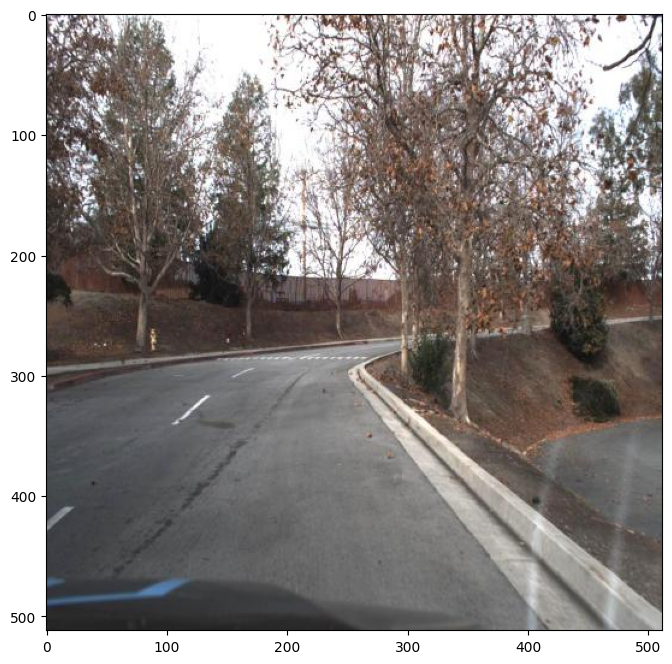

[3 8 8 4 4 3 3 3]
Image index:  24485


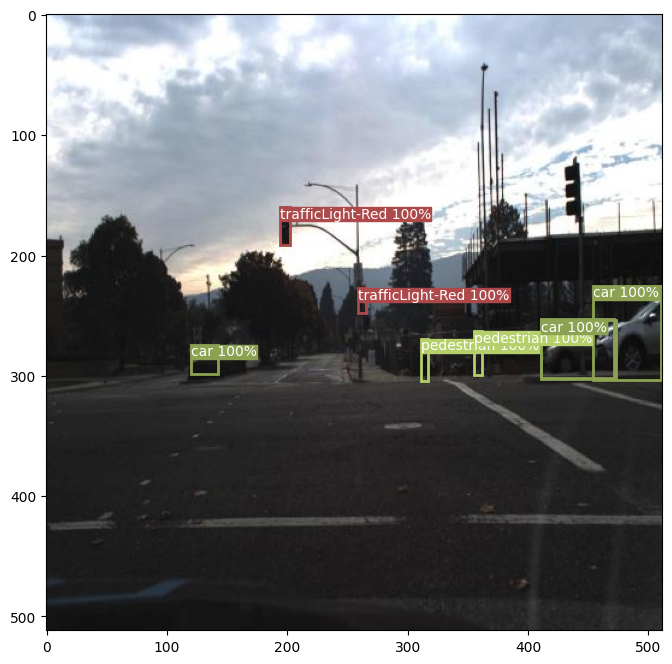

[ 4  4  4 12  4  3  3]
Image index:  7580


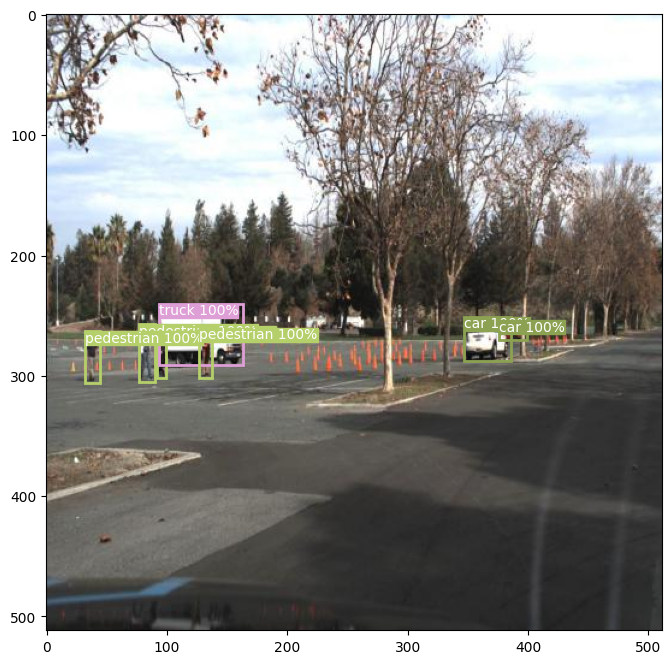

[12  3  3  3  3 12  3  3]
Image index:  28710


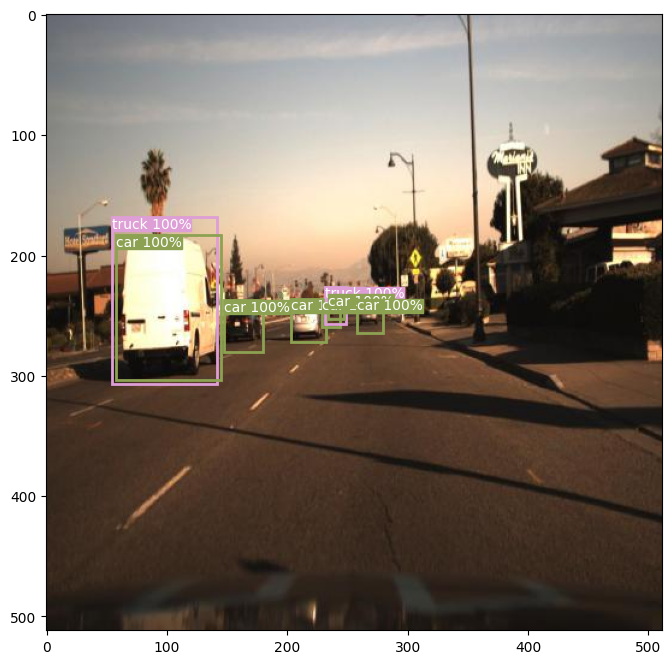

[3 3 3 3 3 3 3 3 3 3 4]
Image index:  25738


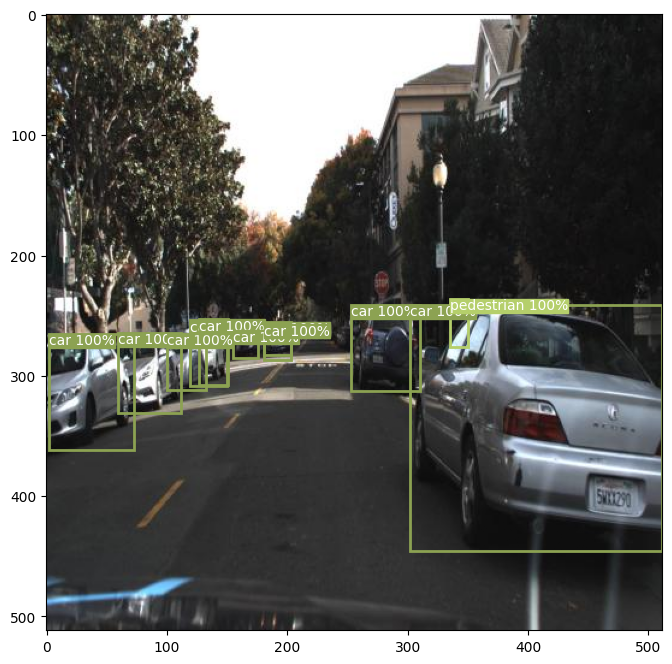

In [9]:
coco_dataset = COCODataset(annotation_file, img_dir, transform=Transformation())  # Assuming Transformation() is defined
categories = ['background','obstacles', 'biker', 'car', 'pedestrian', 'trafficLight', 'trafficLight-Green', 'trafficLight-GreenLeft', 'trafficLight-Red', 'trafficLight-RedLeft', 'trafficLight-Yellow', 'trafficLight-YellowLeft', 'truck']

num_images = 5

for _ in range(num_images):
    x = random.randint(0, len(coco_dataset) - 1)
    img, target = coco_dataset[x]

    if isinstance(img, torch.Tensor):
        img = img.cpu().permute(1, 2, 0).numpy()
    boxes = target['boxes'].numpy()
    labels = target['labels'].numpy()

    print(labels)

    category_names = [categories[ids] if ids < len(categories) else 'Unknown' for ids in labels]

    scores = [1] * len(labels)
    print("Image index: ", x)
    plot_image(img, boxes, scores, labels, categories)


# Fine - Tune the model

In [10]:
# Hyperparameters

SEED = 42

TEST_SIZE = 0.2

NUM_EPOCHS = 5

LR = 0.003
LR_MOMENTUM=0.9
LR_DECAY_RATE=0.0005

LR_SCHED_STEP_SIZE = 2
LR_SCHED_GAMMA = 0.1

BATCH_SIZE = 16

NUM_TEST_IMAGES = 5
NMS_THRESH = 0.3

In [11]:

OUTPUT_DIR = '/content/drive/MyDrive/ML_Final/Final_Fine_Tune'
#OUTPUT_DIR = '/content/drive/MyDrive/ML_Final/experiment_time'

In [12]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
print("We use the following device: ", device)


We use the following device:  cuda


In [13]:
categories = ['background', 'obstacles', 'biker', 'car', 'pedestrian', 'trafficLight', 'trafficLight-Green', 'trafficLight-GreenLeft', 'trafficLight-Red', 'trafficLight-RedLeft', 'trafficLight-Yellow', 'trafficLight-YellowLeft', 'truck']

# The number of classes including background
num_classes = len(categories)

device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

model = torchvision.models.detection.fasterrcnn_resnet50_fpn(min_size=300, max_size=480, pretrained=True)

in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
model.to(device)

num_epochs = NUM_EPOCHS

# construct an optimizer
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=LR, momentum=LR_MOMENTUM, weight_decay=LR_DECAY_RATE)

# split the dataset in train and test set
dataset = COCODataset(annotation_file, img_dir, transform=Transformation())
dataset_test = COCODataset(annotation_file, img_dir, transform=None)

torch.manual_seed(SEED)
indices = torch.randperm(len(dataset)).tolist()

test_size = int(len(dataset) * TEST_SIZE)
dataset = torch.utils.data.Subset(dataset, indices[:-test_size])
dataset_test = torch.utils.data.Subset(dataset_test, indices[-test_size:])

# create a learning rate scheduler
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, \
                                                step_size=LR_SCHED_STEP_SIZE, \
                                                gamma=LR_SCHED_GAMMA)

def collate_fn(batch):
  return tuple(zip(*batch))

# define training and validation data loaders
data_loader = torch.utils.data.DataLoader(
  dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2,
  collate_fn=collate_fn)

data_loader_test = torch.utils.data.DataLoader(
  dataset_test, batch_size=1, shuffle=False, num_workers=2,
  collate_fn=collate_fn)


The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:01<00:00, 159MB/s]


loading annotations into memory...
Done (t=1.19s)
creating index...
index created!
loading annotations into memory...
Done (t=1.26s)
creating index...
index created!


In [14]:
print(len(data_loader_test.dataset))
print(len(data_loader.dataset))

5960
23840


In [15]:
!pip install torchmetrics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 806.1/806.1 kB 7.1 MB/s eta 0:00:00


In [16]:
import torchmetrics
from torchmetrics.detection.mean_ap import MeanAveragePrecision

'''
Function to train the model over one epoch.
'''
def train_one_epoch(model, optimizer, data_loader, device, epoch):
  train_loss_list = []

  tqdm_bar = tqdm(data_loader, total=len(data_loader))
  for idx, data in enumerate(tqdm_bar):
    optimizer.zero_grad()
    images, targets = data

    images = list(image.to(device) for image in images)
    targets = [{k: v.to(device) for k, v in t.items()} for t in targets]  # targets = {'boxes'=tensor, 'labels'=tensor}

    losses = model(images, targets)

    loss = sum(loss for loss in losses.values())
    loss_val = loss.item()
    train_loss_list.append(loss.detach().cpu().numpy())

    loss.backward()
    optimizer.step()

    tqdm_bar.set_description(desc=f"Training Loss: {loss:.3f}")

  return train_loss_list

'''
Function to validate the model
'''
def evaluate(model, data_loader_test, device):
    val_loss_list = []

    tqdm_bar = tqdm(data_loader_test, total=len(data_loader_test))

    for i, data in enumerate(tqdm_bar):
        images, targets = data

        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        with torch.no_grad():
            losses = model(images, targets)

        loss = sum(loss for loss in losses.values())
        loss_val = loss.item()
        val_loss_list.append(loss_val)

        tqdm_bar.set_description(desc=f"Validation Loss: {loss:.4f}")
    return val_loss_list


import matplotlib.pyplot as plt

def plot_loss_baseline(val_loss_list, title='Baseline Model Validation Loss'):
    """
    Plots the validation loss of the baseline model.

    Parameters:
    val_loss_list (list): List of validation losses.
    title (str): Title of the plot.
    """
    plt.figure(figsize=(10, 6))
    plt.plot(val_loss_list, label='Validation Loss')
    plt.title(title)
    plt.xlabel('Batch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.show()

'''
Function to plot training and valdiation losses and save them in `output_dir'
'''
def plot_loss(train_loss, valid_loss, output_dir):
    # Determine common scale for y-axis
    max_loss = max(max(train_loss), max(valid_loss))
    min_loss = min(min(train_loss), min(valid_loss))

    # Apply a buffer to max_loss for better visualization
    y_lim_upper = max_loss + (max_loss - min_loss) * 0.1
    y_lim_lower = min_loss - (max_loss - min_loss) * 0.1

    figure_1, train_ax = plt.subplots()
    figure_2, valid_ax = plt.subplots()

    train_ax.plot(train_loss, color='blue')
    train_ax.set_xlabel('Iteration')
    train_ax.set_ylabel('Training Loss')
    train_ax.set_ylim([y_lim_lower, y_lim_upper])  # Set y-axis limits

    valid_ax.plot(valid_loss, color='red')
    valid_ax.set_xlabel('Iteration')
    valid_ax.set_ylabel('Validation Loss')
    valid_ax.set_ylim([y_lim_lower, y_lim_upper])  # Set y-axis limits

    figure_1.savefig(f"{output_dir}/train_loss.png")
    figure_2.savefig(f"{output_dir}/valid_loss.png")

The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
Validation Loss: 2.7141: 100%|██████████| 5960/5960 [03:34<00:00, 27.83it/s]


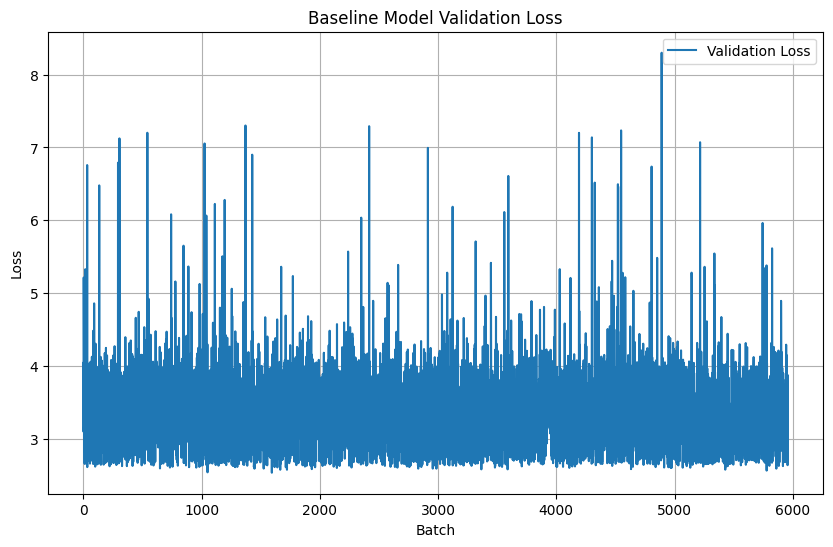

In [17]:
#@title baseline model
import torchvision
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.rpn import AnchorGenerator

# load a pre-trained model for common objects in COCO
baseline_model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)

# For evaluation we don't need gradients
for parameter in baseline_model.parameters():
    parameter.requires_grad = False

baseline_model.eval()  # Set the model to evaluation mode

# Move the model to the appropriate device
baseline_model.to(device)

# Assuming 'data_loader_test' is your validation data loader and the model and device are properly set
valid_loss_list = evaluate(model, data_loader_test, device)

plot_loss_baseline(valid_loss_list)

----------Epoch 1----------


Validation Loss: 0.0004: 100%|██████████| 5960/5960 [03:42<00:00, 26.79it/s]


----------Epoch 2----------


Validation Loss: 0.0000: 100%|██████████| 5960/5960 [03:41<00:00, 26.88it/s]


----------Epoch 3----------


Validation Loss: 0.0000: 100%|██████████| 5960/5960 [03:38<00:00, 27.30it/s]


----------Epoch 4----------


Validation Loss: 0.0000: 100%|██████████| 5960/5960 [03:37<00:00, 27.42it/s]


----------Epoch 5----------


Validation Loss: 0.0000: 100%|██████████| 5960/5960 [03:36<00:00, 27.49it/s]


Training Finished !


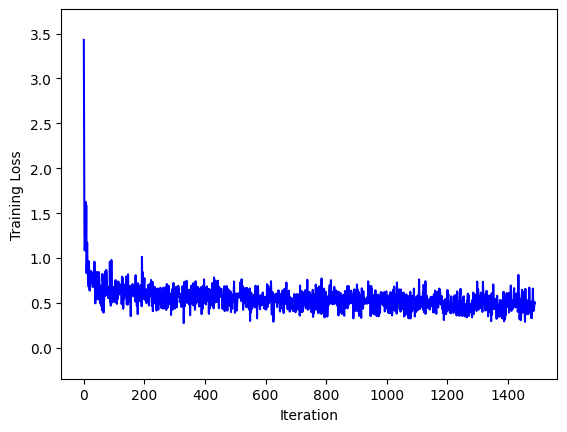

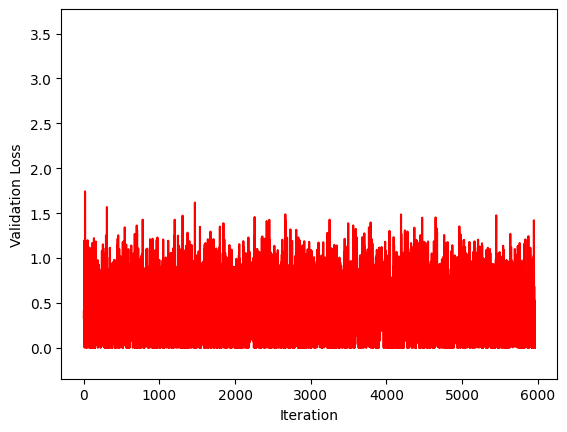

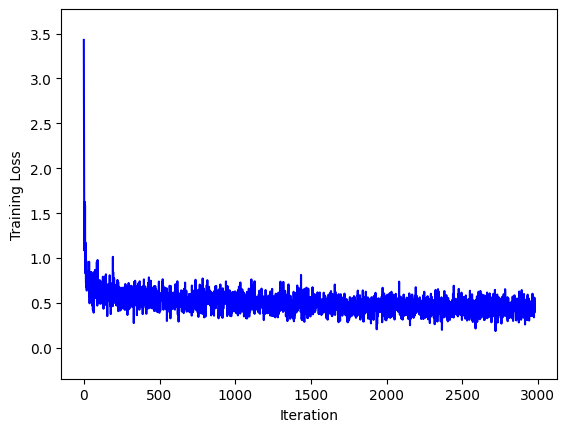

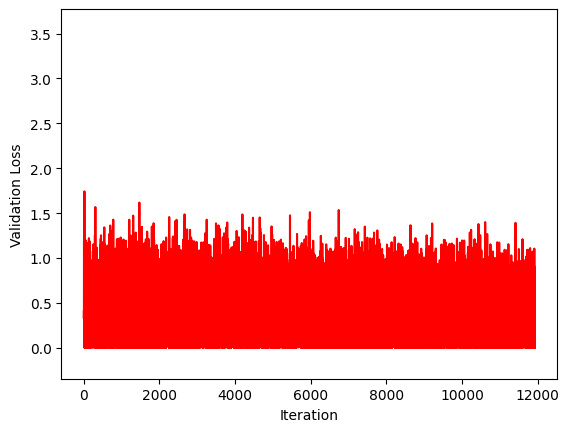

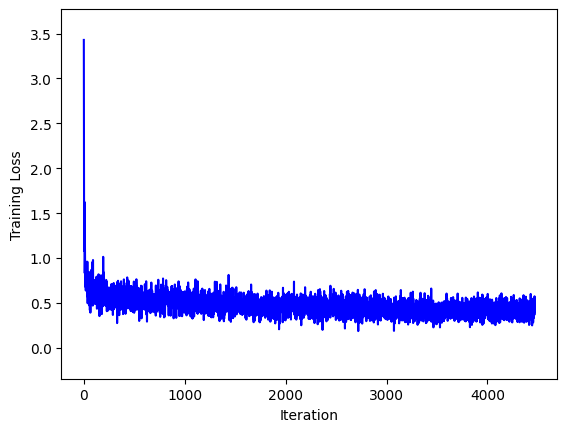

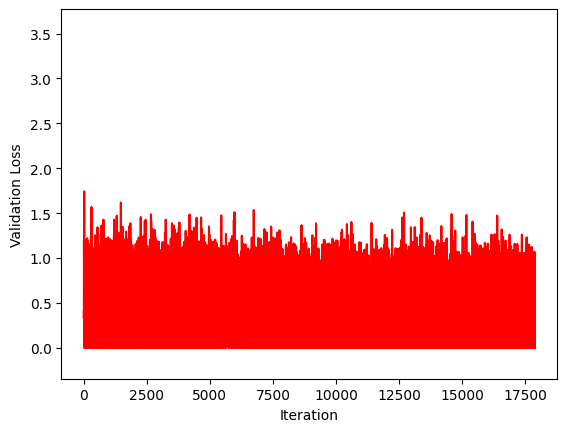

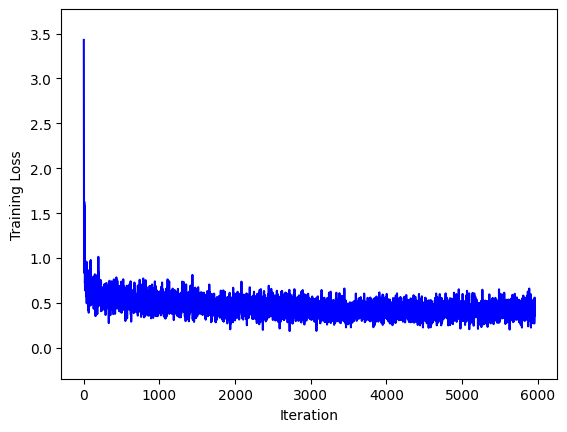

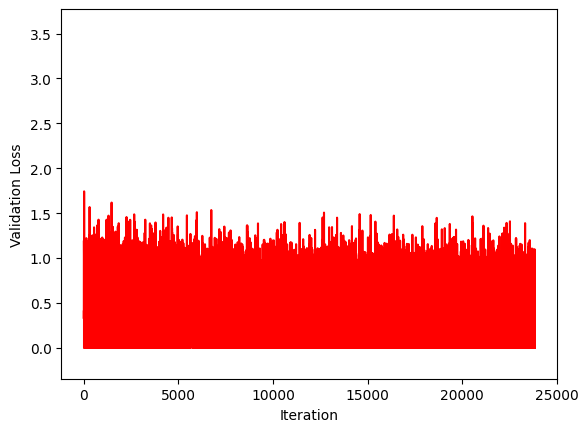

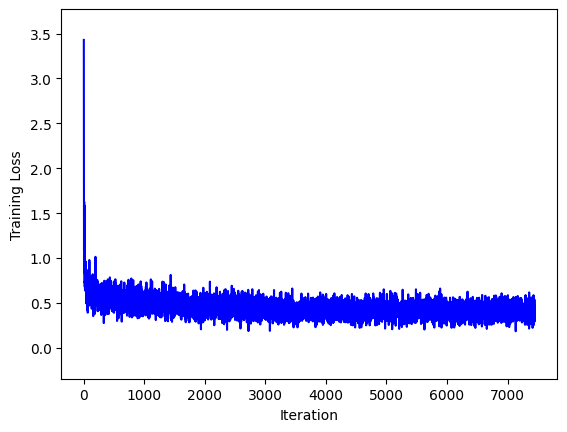

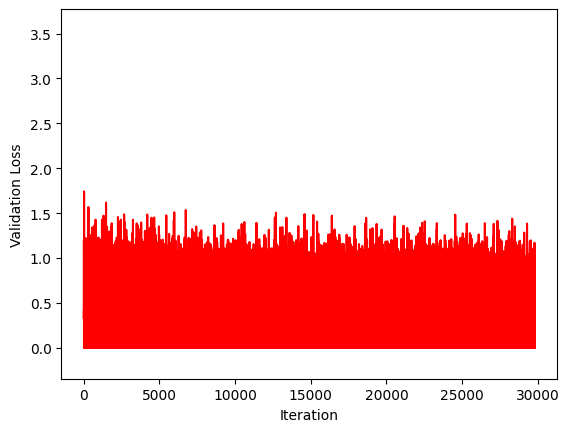

In [18]:
#@title Fine-Tuning
import torchmetrics
from torchmetrics.detection.mean_ap import MeanAveragePrecision

# find latest saved chcekpoint
checkpoint_files = [f for f in os.listdir(OUTPUT_DIR) if f.endswith('.pth')]
if checkpoint_files:
    # Last ckpt file
    checkpoint_files.sort()
    latest_checkpoint = os.path.join(OUTPUT_DIR, checkpoint_files[-1])

    # Load the ckpt
    checkpoint = torch.load(latest_checkpoint)
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    start_epoch = checkpoint['epoch']
    loss_dict = checkpoint['loss_dict']
else:
    start_epoch = 0
    loss_dict = {'train_loss': [], 'valid_loss': []}

'''
Train the model over all epochs
'''
for epoch in range(start_epoch, num_epochs):
  print("----------Epoch {}----------".format(epoch+1))

  # Train the model for one epoch
  train_loss_list = train_one_epoch(model, optimizer, data_loader, device, epoch)
  loss_dict['train_loss'].extend(train_loss_list)

  lr_scheduler.step()

  # Run evaluation
  valid_loss_list = evaluate(model, data_loader_test, device)
  loss_dict['valid_loss'].extend(valid_loss_list)

  # Save the model ckpt after every epoch
  ckpt_file_name = f"{OUTPUT_DIR}/epoch_{epoch+1}_model.pth"
  torch.save({
    'epoch': epoch+1,
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'loss_dict': loss_dict
  }, ckpt_file_name)

  # NOTE: The losses are accumulated over all iterations
  plot_loss(loss_dict['train_loss'], loss_dict['valid_loss'], OUTPUT_DIR)

# Store the losses after the training
with open(f"{OUTPUT_DIR}/loss_dict.pkl", "wb") as file:
    pickle.dump(loss_dict, file)

print("Training Finished !")

# Quantitative and Qualitative results

In [19]:
import numpy as np

def calculate_iou(boxA, boxB):
    # Determine the coordinates of the intersection rectangle
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])

    # Compute the area of intersection
    interArea = max(0, xB - xA) * max(0, yB - yA)

    # Compute the area of both the prediction and ground-truth rectangles
    boxAArea = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxBArea = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])

    # Compute the intersection over union
    iou = interArea / float(boxAArea + boxBArea - interArea)

    return iou

def calculate_precision_recall(predicted_boxes, predicted_labels, ground_truth_boxes, ground_truth_labels, iou_threshold=0.5):
    true_positives = 0
    false_positives = 0
    false_negatives = len(ground_truth_boxes)

    # Iterate over all predicted boxes and labels
    for pred_box, pred_label in zip(predicted_boxes, predicted_labels):
        matched = False
        for gt_box, gt_label in zip(ground_truth_boxes, ground_truth_labels):
            if pred_label == gt_label and calculate_iou(pred_box, gt_box) >= iou_threshold:
                true_positives += 1
                false_negatives -= 1
                matched = True
                break  # A predicted box matches at most one ground truth box
        if not matched:
            false_positives += 1

    precision = true_positives / (true_positives + false_positives) if (true_positives + false_positives) > 0 else 0
    recall = true_positives / (true_positives + false_negatives) if (true_positives + false_negatives) > 0 else 0

    return precision, recall


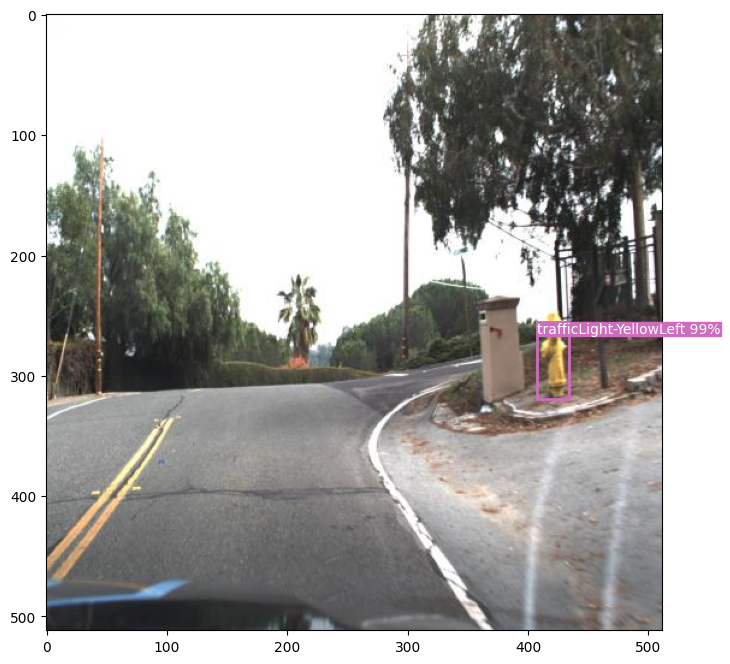

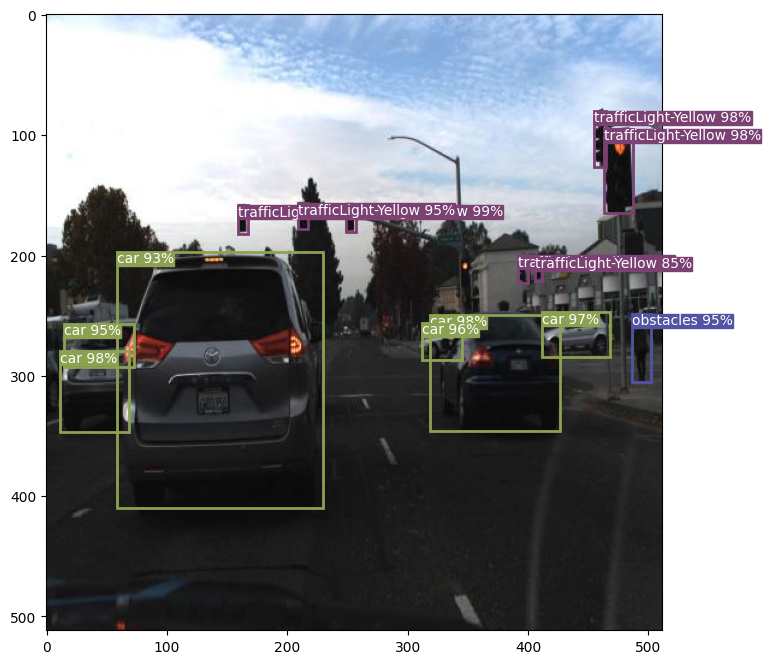

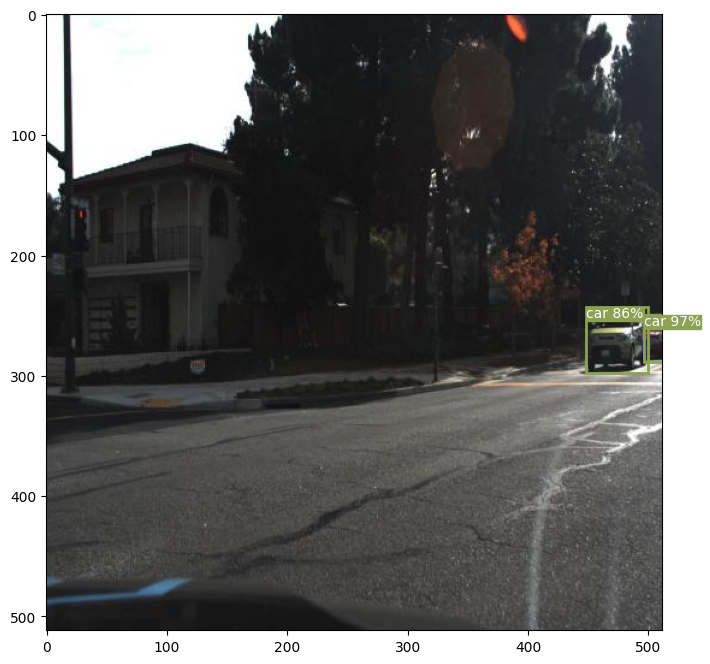

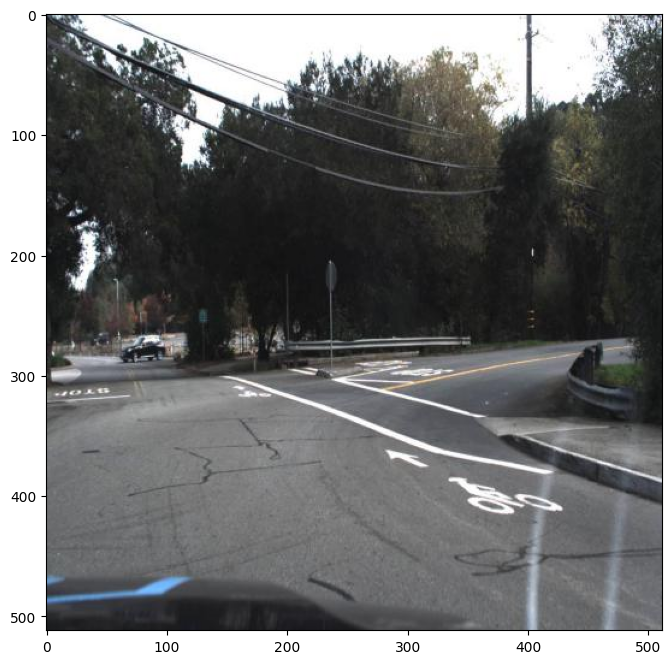

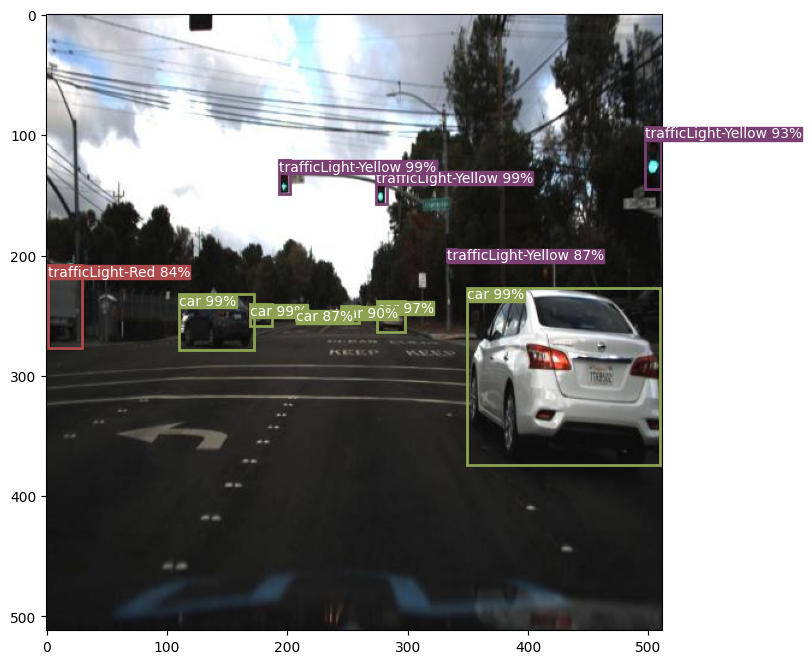

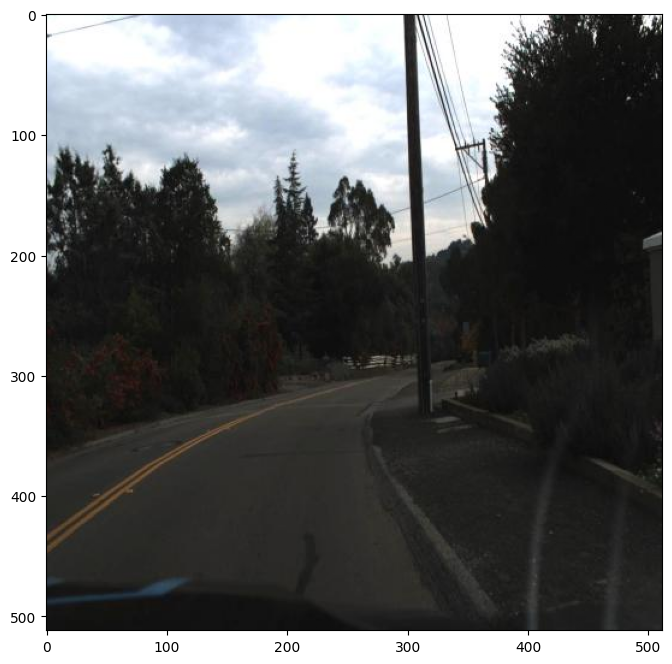

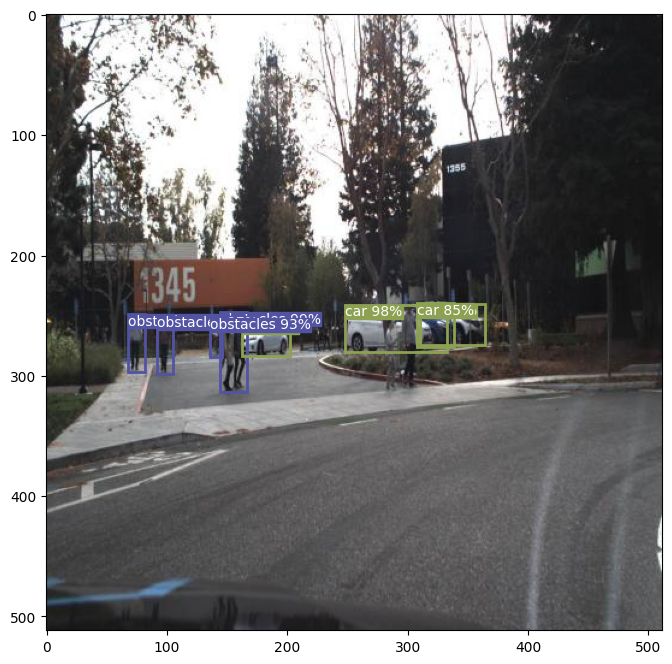

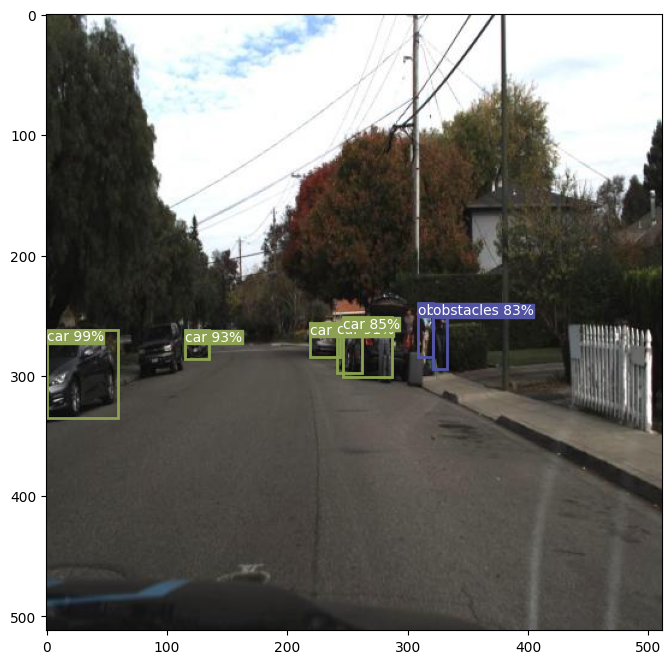

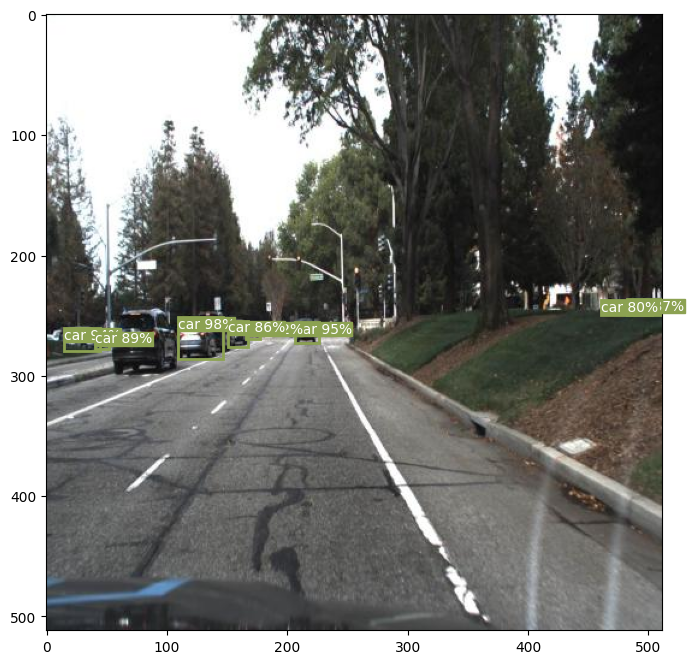

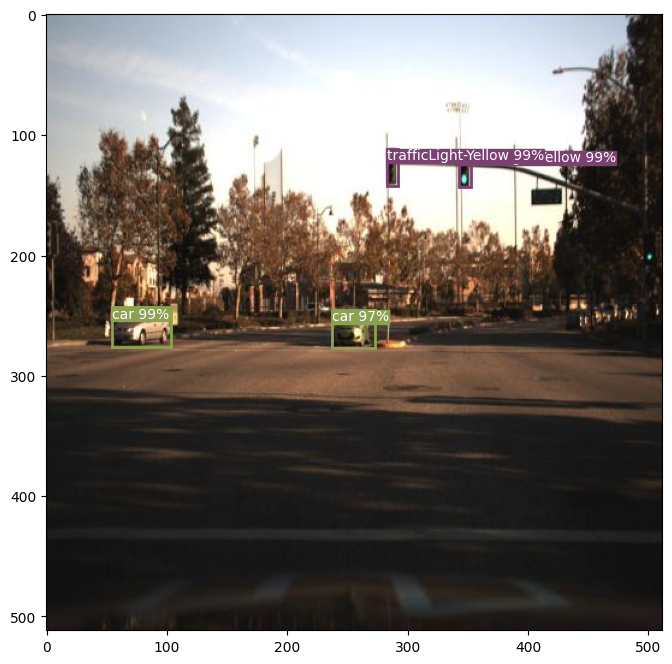

Average IoU: 0.057597059415528666
Average Precision: 0.2758116883116883
Average Recall: 0.2154970760233918


In [22]:
# @title baseline model, this method can be used to see qualitative images or quantitative results

random.seed(SEED)
# Update the categories to match the new dataset
categories = ['background', 'obstacles', 'biker', 'car', 'pedestrian', 'trafficLight', 'trafficLight-Green', 'trafficLight-GreenLeft', 'trafficLight-Red', 'trafficLight-RedLeft', 'trafficLight-Yellow', 'trafficLight-YellowLeft', 'truck']
num_images = 10

def inference(img, model, threshold=0.5):
    baseline_model.eval()
    with torch.no_grad():
        prediction = baseline_model([img.to(device)])
    # Apply threshold to prediction scores
    pred_scores = prediction[0]['scores']
    keep = pred_scores >= threshold
    pred_boxes = prediction[0]['boxes'][keep]
    pred_labels = prediction[0]['labels'][keep]
    pred_scores = pred_scores[keep]
    return pred_boxes, pred_scores, pred_labels

baseline_model.to(device)
baseline_model.eval()  # Set the model to evaluation mode


# Initialize lists for metrics
iou_scores = []
precisions = []
recalls = []

for i in range(num_images):
    x = random.randint(0, len(dataset_test) - 1)
    img, target = dataset_test[i+10]
    img = img.to(device)  # Send image to device

    prediction_threshold = 0.8
    boxes, scores, labels = inference(img, baseline_model, prediction_threshold)

    # Convert boxes from tensor to numpy array, same for labels and scores if necessary
    boxes = boxes.cpu().numpy()
    labels = labels.cpu().numpy()
    scores = scores.cpu().numpy()
    # Convert ground truth boxes and labels to numpy arrays
    gt_boxes = target['boxes'].cpu().numpy()
    gt_labels = target['labels'].cpu().numpy()

    # Calculate IoU, precision, and recall for each image
    ious = [calculate_iou(pred_box, gt_box) for pred_box in boxes for gt_box in gt_boxes]
    precision, recall = calculate_precision_recall(boxes, labels, gt_boxes, gt_labels)

    iou_scores.extend(ious)
    precisions.append(precision)
    recalls.append(recall)

    # Convert the image tensor to numpy for visualization
    img = img.permute(1, 2, 0).cpu().numpy()  # Adjust permute for your image format if needed

    # Convert category IDs to category names
    #category_names = [categories[label] for label in labels]

    # Plot the image with bounding boxes and labels
    ###CHANGE NUMBER OF TEST IMAGES BEFORE USING THIS
    plot_image(img, boxes, scores, labels ,categories ,save_path=f"{OUTPUT_DIR}/inference_{x}.png")
# Average metrics
avg_iou = sum(iou_scores) / len(iou_scores)
avg_precision = sum(precisions) / len(precisions)
avg_recall = sum(recalls) / len(recalls)

print(f"Average IoU: {avg_iou}")
print(f"Average Precision: {avg_precision}")
print(f"Average Recall: {avg_recall}")

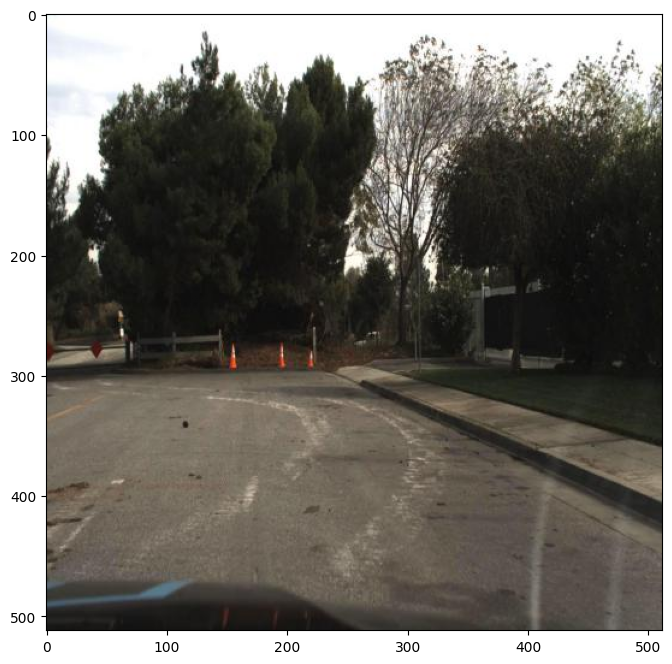

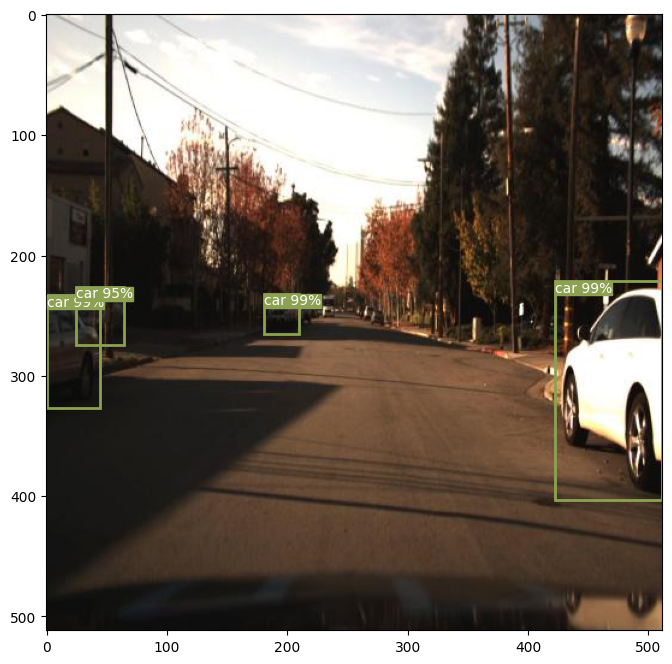

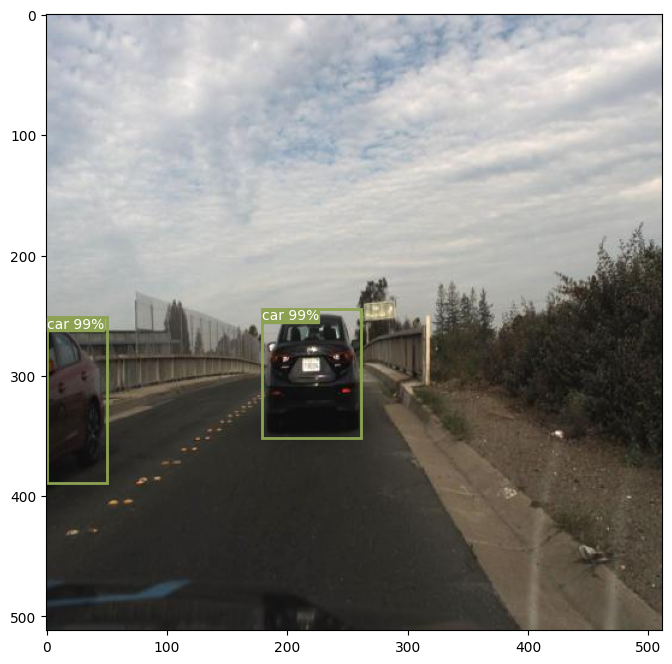

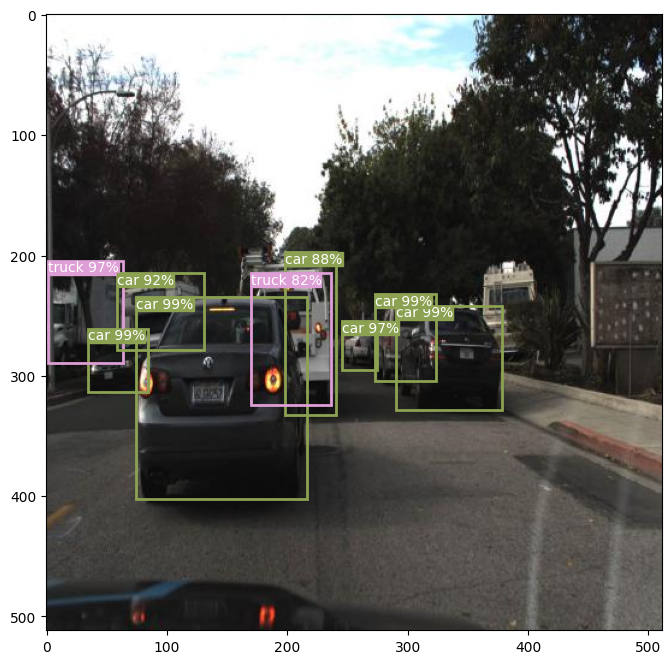

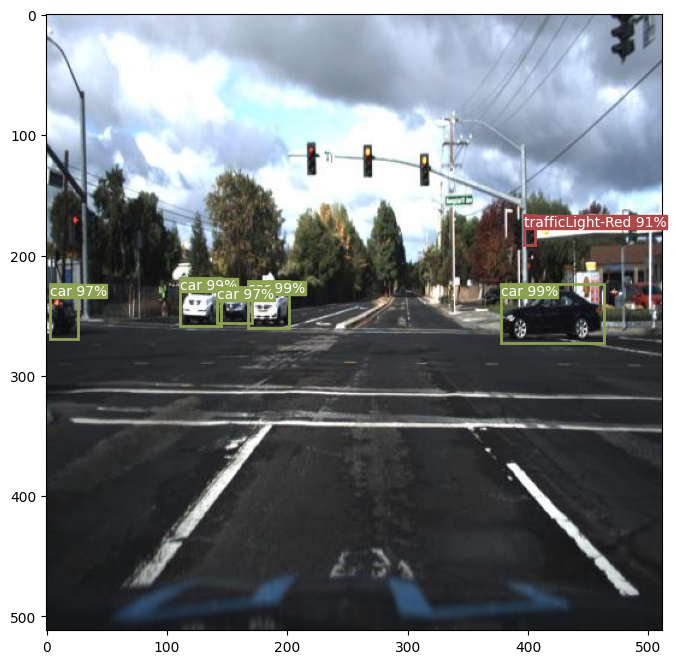

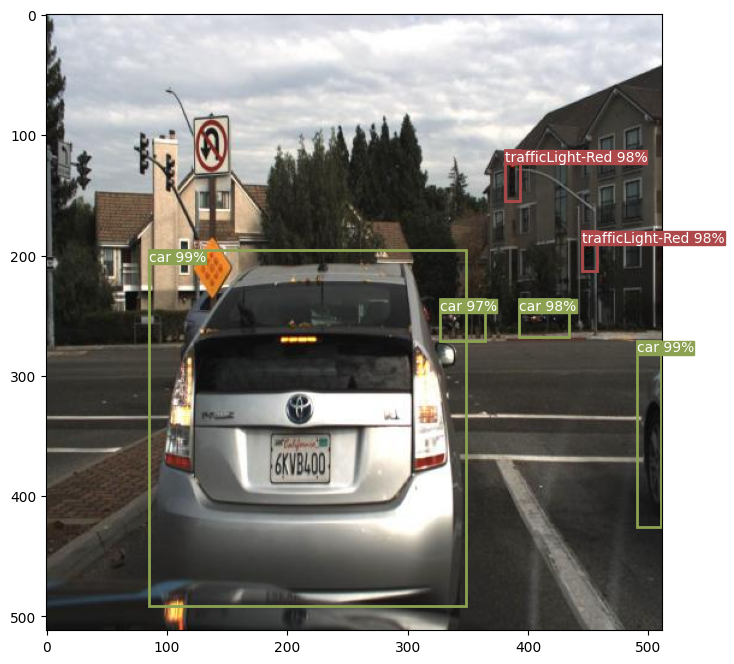

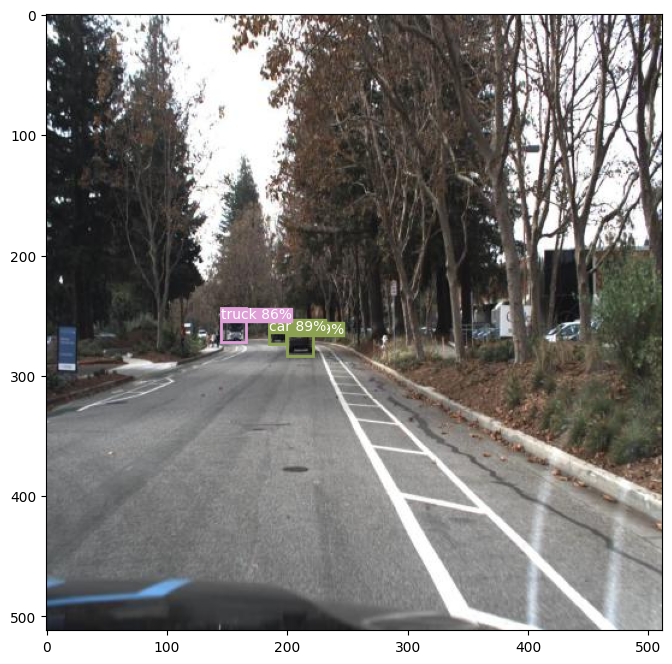

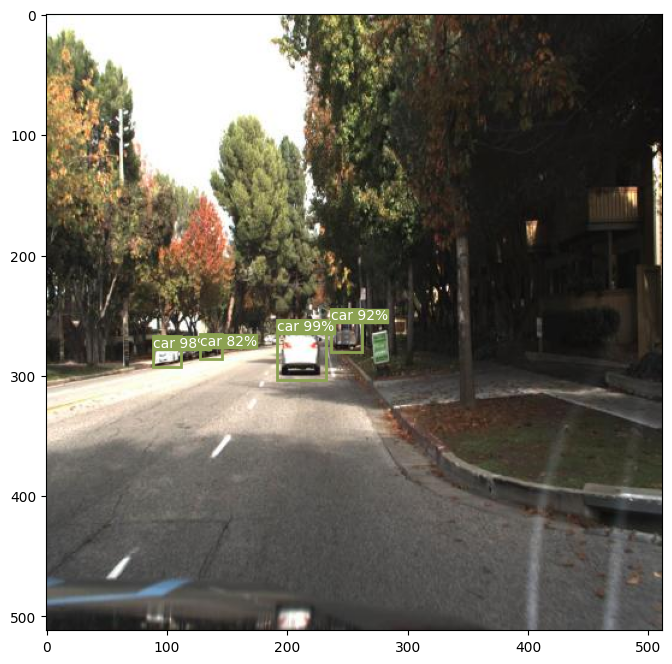

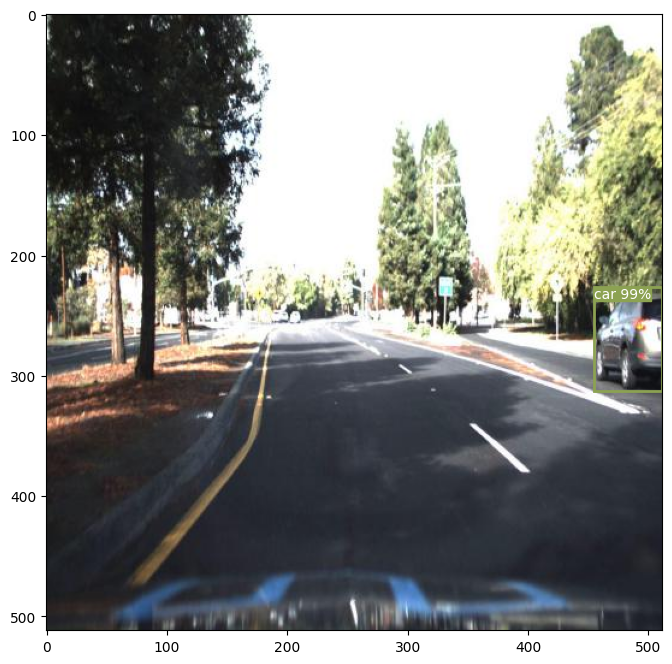

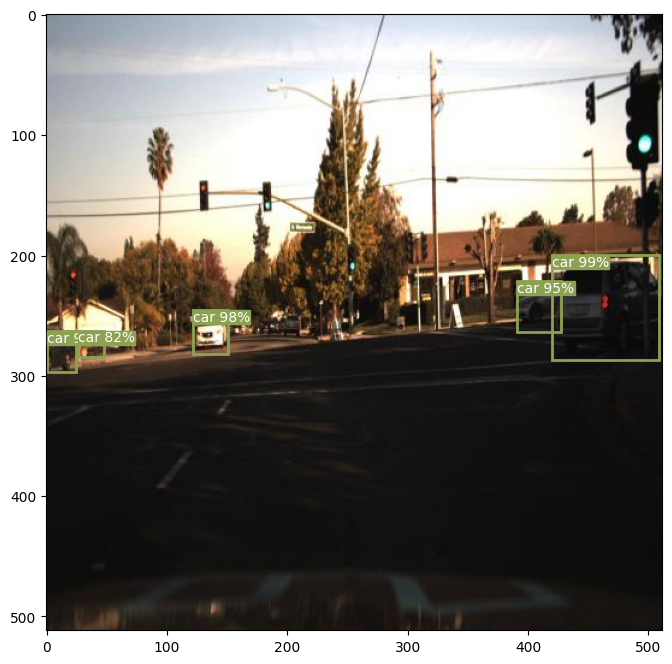

Average IoU: 0.09827502886570672
Average Precision: 0.8416666666666668
Average Recall: 0.5718589743589744


In [23]:
# @title same method as above but for the fine-tuned model

random.seed(SEED)
# Update the categories to match the new dataset
categories = ['background', 'obstacles', 'biker', 'car', 'pedestrian', 'trafficLight', 'trafficLight-Green', 'trafficLight-GreenLeft', 'trafficLight-Red', 'trafficLight-RedLeft', 'trafficLight-Yellow', 'trafficLight-YellowLeft', 'truck']
num_images = 10

def inference(img, model, threshold=0.5):
    model.eval()
    with torch.no_grad():
        prediction = model([img.to(device)])
    # Apply threshold to prediction scores
    pred_scores = prediction[0]['scores']
    keep = pred_scores >= threshold
    pred_boxes = prediction[0]['boxes'][keep]
    pred_labels = prediction[0]['labels'][keep]
    pred_scores = pred_scores[keep]
    return pred_boxes, pred_scores, pred_labels

# Load last checkpoint
checkpoint_dir = f"{OUTPUT_DIR}/epoch_{NUM_EPOCHS}_model.pth"
checkpoint = torch.load(checkpoint_dir, map_location=device)
model.load_state_dict(checkpoint['model_state_dict'])
model.to(device)
model.eval()  # Set the model to evaluation mode


# Initialize lists for metrics
iou_scores = []
precisions = []
recalls = []

for i in range(num_images):
    x = random.randint(0, len(dataset_test) - 1)
    img, target = coco_dataset[i+10]
    img = img.to(device)  # Send image to device

    prediction_threshold = 0.8
    boxes, scores, labels = inference(img, model, prediction_threshold)

    # Convert boxes from tensor to numpy array, same for labels and scores if necessary
    boxes = boxes.cpu().numpy()
    labels = labels.cpu().numpy()
    scores = scores.cpu().numpy()
    # Convert ground truth boxes and labels to numpy arrays
    gt_boxes = target['boxes'].cpu().numpy()
    gt_labels = target['labels'].cpu().numpy()

    # Calculate IoU, precision, and recall for each image
    ious = [calculate_iou(pred_box, gt_box) for pred_box in boxes for gt_box in gt_boxes]
    precision, recall = calculate_precision_recall(boxes, labels, gt_boxes, gt_labels)

    iou_scores.extend(ious)
    precisions.append(precision)
    recalls.append(recall)

    # Convert the image tensor to numpy for visualization
    img = img.permute(1, 2, 0).cpu().numpy()

    # Convert category IDs to category names
    category_names = [categories[label] for label in labels]

    # Plot the image with bounding boxes and labels
    ###CHANGE NUMBER OF TEST IMAGES BEFORE USING THIS
    plot_image(img, boxes, scores, labels ,categories ,save_path=f"{OUTPUT_DIR}/inference_{x}.png")
# Average metrics
avg_iou = sum(iou_scores) / len(iou_scores)
avg_precision = sum(precisions) / len(precisions)
avg_recall = sum(recalls) / len(recalls)

print(f"Average IoU: {avg_iou}")
print(f"Average Precision: {avg_precision}")
print(f"Average Recall: {avg_recall}")

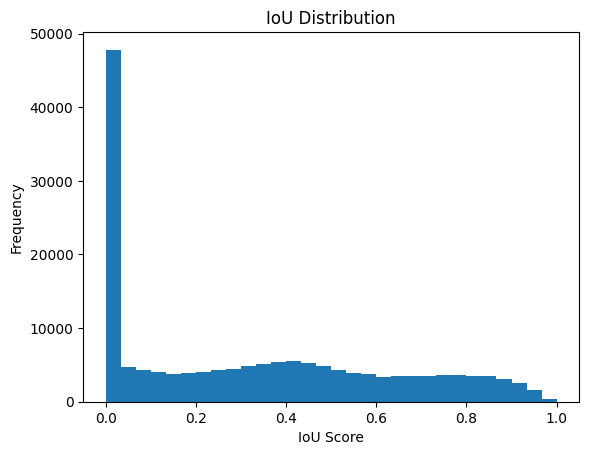

In [ ]:
import matplotlib.pyplot as plt

def plot_iou_distribution(model, data_loader, device, iou_threshold=0.5):
    iou_scores = []

    model.eval()
    with torch.no_grad():
        for images, targets in data_loader:
            images = list(image.to(device) for image in images)
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

            predictions = model(images)

            for target, prediction in zip(targets, predictions):
                gt_boxes = target['boxes'].cpu().numpy()
                pred_boxes = prediction['boxes'].cpu().numpy()

                for pred_box in pred_boxes:
                    ious = [calculate_iou(pred_box, gt_box) for gt_box in gt_boxes]
                    best_iou = max(ious) if ious else 0
                    iou_scores.append(best_iou)

    plt.hist(iou_scores, bins=30, range=(0,1))
    plt.title('IoU Distribution')
    plt.xlabel('IoU Score')
    plt.ylabel('Frequency')
    plt.show()

# Example usage
plot_iou_distribution(model, data_loader_test, device)


In [25]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

def plot_confusion_matrix(model, data_loader, device, categories, iou_threshold=0.5, score_threshold=0.5):
    all_gt_labels = []
    all_pred_labels = []

    model.eval()
    with torch.no_grad():
        for images, targets in data_loader:
            images = list(image.to(device) for image in images)
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

            predictions = model(images)

            for target, prediction in zip(targets, predictions):
                gt_boxes = target['boxes'].cpu().numpy()
                gt_labels = target['labels'].cpu().numpy()
                pred_boxes = prediction['boxes'].cpu().numpy()
                pred_labels = prediction['labels'].cpu().numpy()
                pred_scores = prediction['scores'].cpu().numpy()

                # Apply the score threshold
                keep = pred_scores >= score_threshold
                pred_boxes = pred_boxes[keep]
                pred_labels = pred_labels[keep]

                for pred_box, pred_label in zip(pred_boxes, pred_labels):
                    ious = [calculate_iou(pred_box, gt_box) for gt_box in gt_boxes]
                    best_iou = max(ious) if ious else 0
                    if best_iou >= iou_threshold:
                        best_gt_idx = ious.index(best_iou)
                        all_pred_labels.append(pred_label)
                        all_gt_labels.append(gt_labels[best_gt_idx])
                    else:
                        all_pred_labels.append(pred_label)
                        all_gt_labels.append(0)  # Assuming 0 is the background class

    cm = confusion_matrix(all_gt_labels, all_pred_labels, labels=range(len(categories)))
    plt.figure(figsize=(10,10))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=categories, yticklabels=categories)
    plt.title('Confusion Matrix')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()

# Example usage
# categories = ['background','obstacles', 'biker', 'car', 'pedestrian', 'trafficLight', 'trafficLight-Green', 'trafficLight-GreenLeft', 'trafficLight-Red', 'trafficLight-RedLeft', 'trafficLight-Yellow', 'trafficLight-YellowLeft', 'truck']
# plot_confusion_matrix(model, data_loader_test, device, categories, score_threshold=0.9)  # Higher threshold


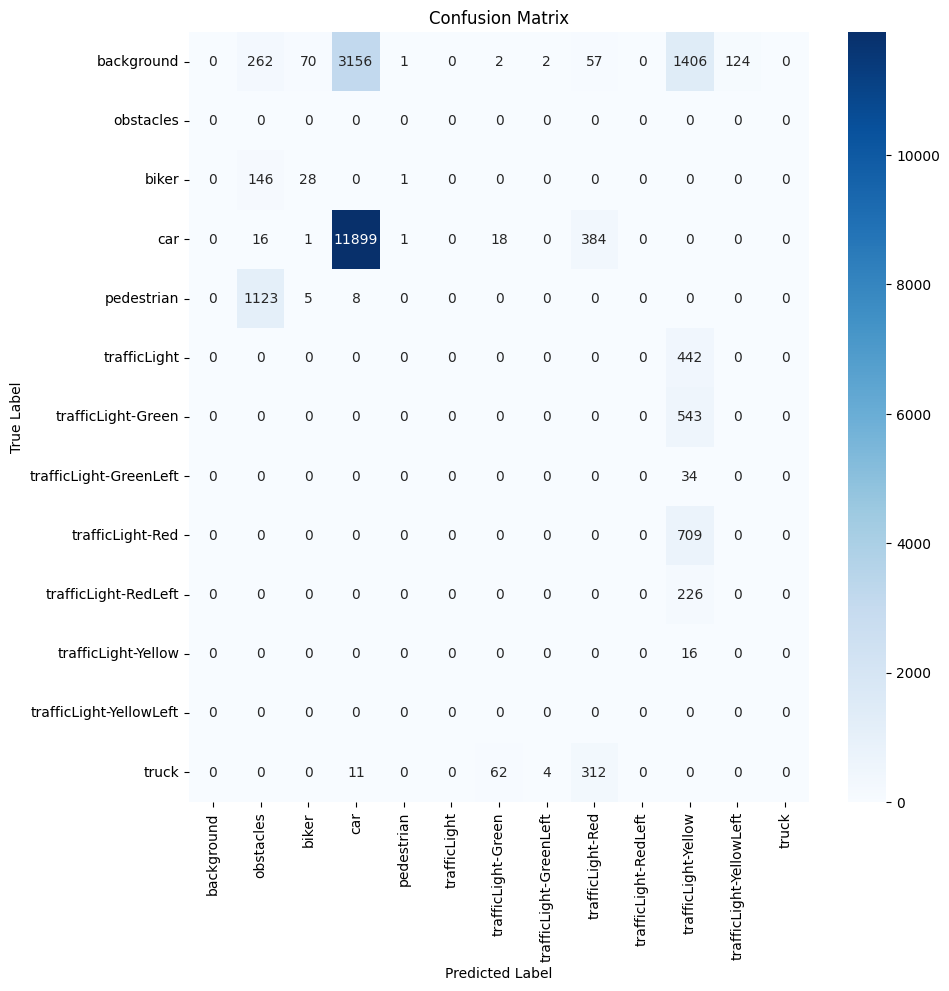

In [ ]:
categories = ['background','obstacles', 'biker', 'car', 'pedestrian', 'trafficLight', 'trafficLight-Green', 'trafficLight-GreenLeft', 'trafficLight-Red', 'trafficLight-RedLeft', 'trafficLight-Yellow', 'trafficLight-YellowLeft', 'truck']
plot_confusion_matrix(baseline_model, data_loader_test, device, categories, score_threshold=0.9)  # Higher threshold

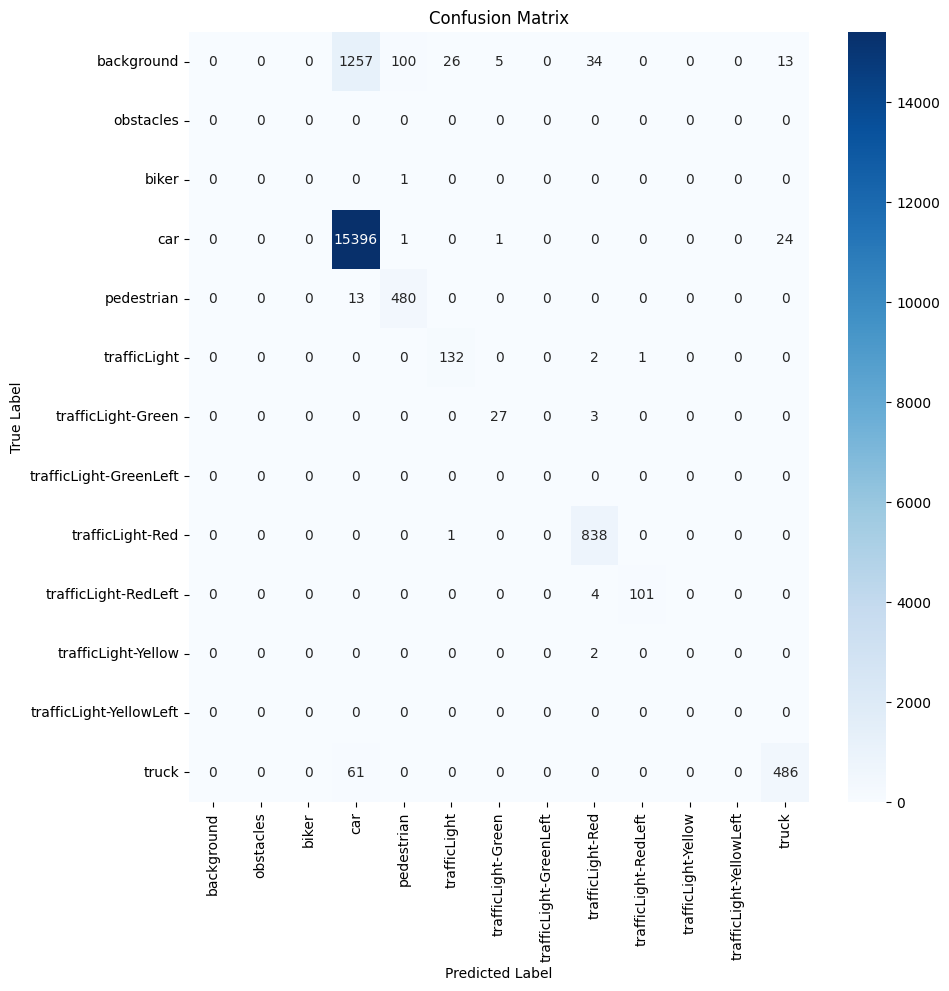

In [26]:
categories = ['background','obstacles', 'biker', 'car', 'pedestrian', 'trafficLight', 'trafficLight-Green', 'trafficLight-GreenLeft', 'trafficLight-Red', 'trafficLight-RedLeft', 'trafficLight-Yellow', 'trafficLight-YellowLeft', 'truck']
plot_confusion_matrix(model, data_loader_test, device, categories, score_threshold=0.9)  # Higher threshold

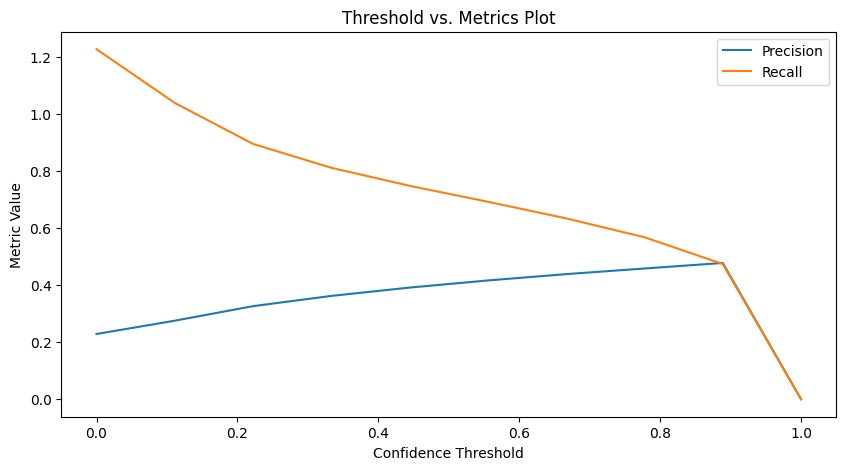

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def threshold_vs_metric_plot(model, data_loader, device, iou_threshold=0.5):
    thresholds = np.linspace(0, 1, 10)
    precisions = []
    recalls = []

    model.eval()
    with torch.no_grad():
        for conf_threshold in thresholds:
            total_true_positives = 0
            total_false_positives = 0
            total_false_negatives = 0

            for images, targets in data_loader:
                images = list(img.to(device) for img in images)
                targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

                predictions = model(images)

                for target, prediction in zip(targets, predictions):
                    gt_boxes = target['boxes'].cpu().numpy()
                    gt_labels = target['labels'].cpu().numpy()
                    pred_boxes = prediction['boxes'].cpu().numpy()
                    pred_labels = prediction['labels'].cpu().numpy()
                    pred_scores = prediction['scores'].cpu().numpy()

                    # Filter out predictions below the confidence threshold
                    keep = pred_scores >= conf_threshold
                    pred_boxes = pred_boxes[keep]
                    pred_labels = pred_labels[keep]

                    true_positives = 0
                    false_positives = len(pred_boxes)
                    false_negatives = len(gt_boxes)

                    for pred_box, pred_label in zip(pred_boxes, pred_labels):
                        ious = [calculate_iou(pred_box, gt_box) for gt_box in gt_boxes]
                        if ious and max(ious) >= iou_threshold:
                            true_positives += 1
                            false_negatives -= 1

                    total_true_positives += true_positives
                    total_false_positives += false_positives
                    total_false_negatives += false_negatives

            precision = total_true_positives / (total_true_positives + total_false_positives) if total_true_positives + total_false_positives > 0 else 0
            recall = total_true_positives / (total_true_positives + total_false_negatives) if total_true_positives + total_false_negatives > 0 else 0

            precisions.append(precision)
            recalls.append(recall)

    plt.figure(figsize=(10, 5))
    plt.plot(thresholds, precisions, label='Precision')
    plt.plot(thresholds, recalls, label='Recall')
    plt.xlabel('Confidence Threshold')
    plt.ylabel('Metric Value')
    plt.title('Threshold vs. Metrics Plot')
    plt.legend()
    plt.show()

# Example usage
threshold_vs_metric_plot(model, data_loader_test, device)


In [ ]:
import numpy as np
import torch
import sys

class MAPCalculator:
    def __init__(self, model, data_loader, device, categories, iou_threshold=0.5):
        self.model = model
        self.data_loader = data_loader
        self.device = device
        self.categories = categories
        self.iou_threshold = iou_threshold
        self.conf_thresholds = [0.5]

    def calculate_iou(self, boxA, boxB):
        # Determine the coordinates of the intersection rectangle
        xA = max(boxA[0], boxB[0])
        yA = max(boxA[1], boxB[1])
        xB = min(boxA[2], boxB[2])
        yB = min(boxA[3], boxB[3])

        # Compute the area of intersection
        interArea = max(0, xB - xA) * max(0, yB - yA)

        # Compute the area of both the prediction and ground-truth rectangles
        boxAArea = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
        boxBArea = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])

        # Compute the intersection over union
        iou = interArea / float(boxAArea + boxBArea - interArea)

        return iou

    def calculate_precision_recall(self, predicted_boxes, predicted_labels, ground_truth_boxes, ground_truth_labels, iou_threshold):
        true_positives = 0
        false_positives = 0
        false_negatives = len(ground_truth_boxes)

        # Iterate over all predicted boxes and labels
        for pred_box, pred_label in zip(predicted_boxes, predicted_labels):
            matched = False
            for gt_box, gt_label in zip(ground_truth_boxes, ground_truth_labels):
                if pred_label == gt_label and calculate_iou(pred_box, gt_box) >= iou_threshold:
                    true_positives += 1
                    false_negatives -= 1
                    matched = True
                    break  # A predicted box matches at most one ground truth box
            if not matched:
                false_positives += 1

        precision = true_positives / (true_positives + false_positives) if (true_positives + false_positives) > 0 else 0
        recall = true_positives / (true_positives + false_negatives) if (true_positives + false_negatives) > 0 else 0

        return precision, recall

    def calculate_ap_per_class(self, conf_threshold, iou_threshold=0.5,):
      # Initialize a dictionary to store precision values for each class
      class_precisions = {category: [] for category in categories}
      total_images = len(self.data_loader.dataset)
      processed_images = 0

      model.eval()
      with torch.no_grad():
          for images, targets in data_loader:
              images = list(img.to(device) for img in images)
              targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

              predictions = model(images)

              for target, prediction in zip(targets, predictions):
                  gt_boxes = target['boxes'].cpu().numpy()
                  gt_labels = target['labels'].cpu().numpy()
                  pred_boxes = prediction['boxes'].cpu().numpy()
                  pred_labels = prediction['labels'].cpu().numpy()
                  pred_scores = prediction['scores'].cpu().numpy()

                  # Filter out predictions with low confidence
                  high_conf_mask = pred_scores >= conf_threshold
                  pred_boxes = pred_boxes[high_conf_mask]
                  pred_labels = pred_labels[high_conf_mask]

                  for cls in range(1, len(categories)):  # Start from 1 to skip the background class
                      cls_mask = pred_labels == cls
                      cls_pred_boxes = pred_boxes[cls_mask]
                      cls_gt_boxes = gt_boxes[gt_labels == cls]

                      true_positives = 0
                      false_positives = 0

                      for pred_box in cls_pred_boxes:
                          ious = [calculate_iou(pred_box, gt_box) for gt_box in cls_gt_boxes]
                          if ious and max(ious) >= iou_threshold:
                              true_positives += 1
                          else:
                              false_positives += 1

                      precision = true_positives / (true_positives + false_positives) if (true_positives + false_positives) > 0 else 0
                      class_precisions[categories[cls]].append(precision)
          processed_images += len(images)
          print(f'\rProcessed {processed_images}/{total_images} images for conf_threshold {conf_threshold:.2f}', end='')
          sys.stdout.flush()

      # Calculate the average precision for each class
      avg_precision_per_class = {cls: np.mean(precisions) if precisions else 0 for cls, precisions in class_precisions.items()}
      return(avg_precision_per_class)

    def calculate_map(self):
        map_scores = []
        for conf_threshold in self.conf_thresholds:
            ap_per_class = self.calculate_ap_per_class(conf_threshold)
            map_scores.append(np.mean(list(ap_per_class.values())))

            # Print progress after each threshold calculation
            print(f'\rConfidence Threshold: {conf_threshold:.2f}')

        overall_map = np.mean(map_scores)
        return overall_map

# map_calculator = MAPCalculator(model, data_loader_test, device, categories)
# overall_map = map_calculator.calculate_map()
# print(f"Mean Average Precision: {overall_map}")


In [ ]:
# getting mAP for baseline and model
baseline_model.to(device)
baseline_model.eval()

map_calculator = MAPCalculator(baseline_model, data_loader_test, device, categories)
overall_map = map_calculator.calculate_map()
print(f"Mean Average Precision Baseline: {overall_map}")

# Load last checkpoint
checkpoint_dir = f"{OUTPUT_DIR}/epoch_{NUM_EPOCHS}_model.pth"
checkpoint = torch.load(checkpoint_dir, map_location=device)
model.load_state_dict(checkpoint['model_state_dict'])
model.to(device)
model.eval()  # Set the model to evaluation mode

map_calculator = MAPCalculator(model, data_loader_test, device, categories)
overall_map = map_calculator.calculate_map()
print(f"Mean Average Precision Fine-Tuned: {overall_map}")